<a href="https://colab.research.google.com/github/rohithkodiyath/INSE6220_PCA/blob/main/PCA%20Analysis%20of%20Dry%20bean%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PyCaret is an open-source, low-code machine learning library in Python designed to make the end-to-end machine learning process easier and faster for both beginners and experienced data scientists. It offers a variety of tools and functions for data preparation, model training, model selection, and deployment.

pip3 install pycaret==2.3.6 is a command used to install a specific version of the PyCaret library in Python. If you encounter an error message, try running the code again.

# Installation and setup

In [1]:
!pip3 install pycaret==3.0.0
!pip3 install git+https://github.com/slundberg/shap.git

In [2]:
from pycaret.utils import version
version()

'3.0.0'

## Importing Libraries

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


## Dataset

The “Occupancy Detection Data Set UCI” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. It is a dataset for predicting room occupancy using environmental factors.

There are 6 attributes with 2665 entries and one column for classification. 0 represents No occupancy and 1 represents There is occupancy.

All attributes are numerical and they are listed bellow:
Date,
Temperature,
Humidity,
Light,
CO2,
HumidityRatio,
Occupancy

The original dataset can be found on below link: https://www.kaggle.com/datasets/robmarkcole/occupancy-detection-data-set-uci

In [5]:
#https://github.com/Shruti-Santoki/INSE6220_40234388/blob/main/datatest.txt
df= pd.read_csv('Dry_Bean_Dataset.csv')

grouped_data = df.groupby('Class').apply(lambda x: x.sample(500))
df = grouped_data.reset_index(drop=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             3500 non-null   int64  
 1   Perimeter        3500 non-null   float64
 2   MajorAxisLength  3500 non-null   float64
 3   MinorAxisLength  3500 non-null   float64
 4   AspectRation     3500 non-null   float64
 5   Eccentricity     3500 non-null   float64
 6   ConvexArea       3500 non-null   int64  
 7   EquivDiameter    3500 non-null   float64
 8   Extent           3500 non-null   float64
 9   Solidity         3500 non-null   float64
 10  roundness        3500 non-null   float64
 11  Compactness      3500 non-null   float64
 12  ShapeFactor1     3500 non-null   float64
 13  ShapeFactor2     3500 non-null   float64
 14  ShapeFactor3     3500 non-null   float64
 15  ShapeFactor4     3500 non-null   float64
 16  Class            3500 non-null   object 
dtypes: float64(14)

In [6]:
df.tail(10)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3490,51260,862.629,329.786338,198.806797,1.658828,0.797866,51880,255.472619,0.748540,0.988049,0.865646,0.774661,0.006434,0.001429,0.600100,0.995462,SIRA
3491,47636,820.625,319.479869,190.329895,1.678559,0.803170,48169,246.276347,0.788558,0.988935,0.888906,0.770867,0.006707,0.001461,0.594235,0.997459,SIRA
3492,45729,804.843,301.585697,194.146778,1.553390,0.765233,46214,241.296438,0.785452,0.989505,0.887114,0.800092,0.006595,0.001667,0.640148,0.994399,SIRA
3493,46043,815.867,306.479971,193.081267,1.587311,0.776598,46746,242.123457,0.746179,0.984961,0.869230,0.790014,0.006656,0.001599,0.624122,0.990676,SIRA
3494,57222,918.039,359.107593,205.106070,1.750838,0.820842,58490,269.920939,0.736258,0.978321,0.853200,0.751644,0.006276,0.001236,0.564968,0.989168,SIRA
3495,39046,762.103,293.484737,170.065284,1.725718,0.814994,39616,222.968409,0.794749,0.985612,0.844810,0.759727,0.007516,0.001545,0.577186,0.996060,SIRA
3496,50544,845.080,323.362311,200.273142,1.614606,0.785118,51173,253.682123,0.804290,0.987708,0.889373,0.784514,0.006398,0.001495,0.615462,0.993728,SIRA
3497,49265,845.236,324.374856,194.362480,1.668917,0.800606,49881,250.451884,0.732456,0.987651,0.866548,0.772106,0.006584,0.001443,0.596148,0.994922,SIRA
3498,53419,877.594,343.427162,198.683132,1.728517,0.815661,53925,260.797207,0.684297,0.990617,0.871602,0.759396,0.006429,0.001319,0.576682,0.996805,SIRA
3499,39480,750.410,285.250401,177.491794,1.607119,0.782833,40031,224.204142,0.805714,0.986236,0.881028,0.785991,0.007225,0.001701,0.617781,0.992848,SIRA


In [7]:
df.shape

(3500, 17)

In [8]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             3500 non-null   int64  
 1   Perimeter        3500 non-null   float64
 2   MajorAxisLength  3500 non-null   float64
 3   MinorAxisLength  3500 non-null   float64
 4   AspectRation     3500 non-null   float64
 5   Eccentricity     3500 non-null   float64
 6   ConvexArea       3500 non-null   int64  
 7   EquivDiameter    3500 non-null   float64
 8   Extent           3500 non-null   float64
 9   Solidity         3500 non-null   float64
 10  roundness        3500 non-null   float64
 11  Compactness      3500 non-null   float64
 12  ShapeFactor1     3500 non-null   float64
 13  ShapeFactor2     3500 non-null   float64
 14  ShapeFactor3     3500 non-null   float64
 15  ShapeFactor4     3500 non-null   float64
 16  Class            3500 non-null   object 
dtypes: float64(14)

In [9]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  5


In [10]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


# Exploratory Data Analysis

sns.pairplot is a function in the seaborn library in Python that is used to plot pairwise relationships between multiple variables in a dataset. The resulting plot is a grid of scatterplots, with each variable plotted against every other variable.



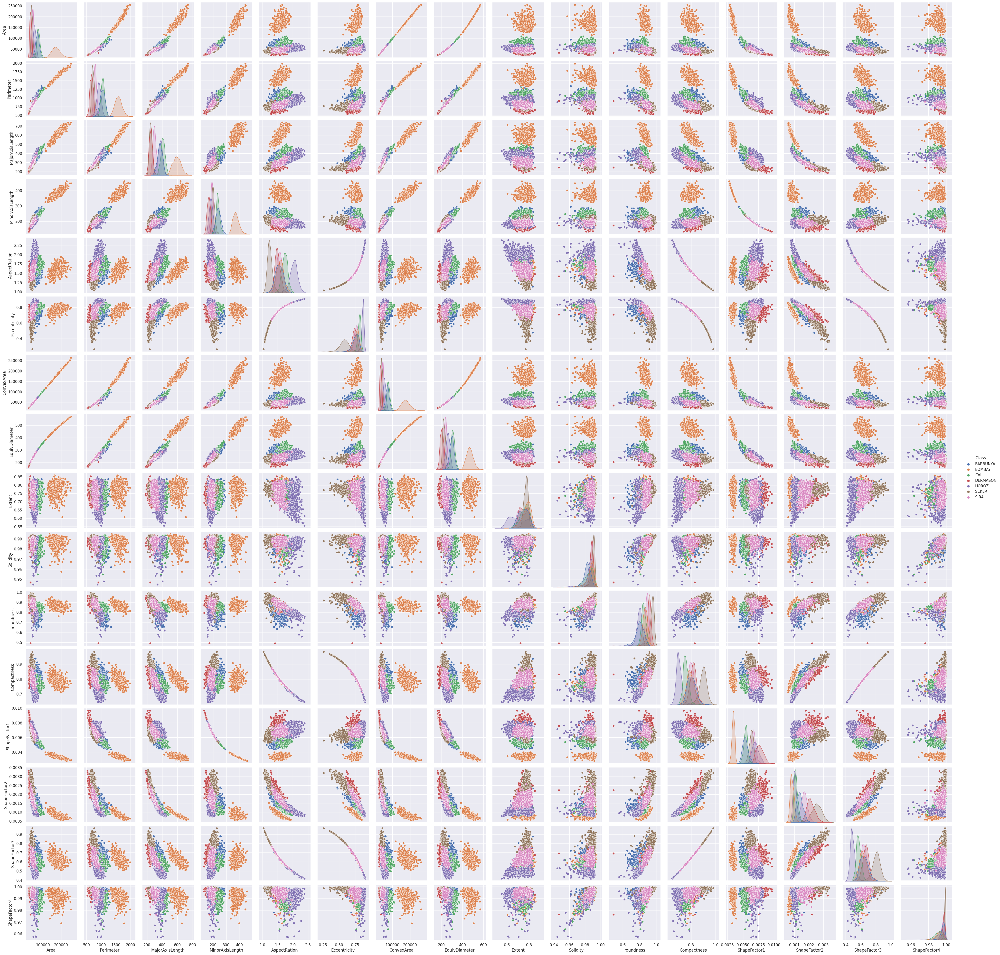

In [11]:
sns.pairplot(df, hue='Class')
plt.show()


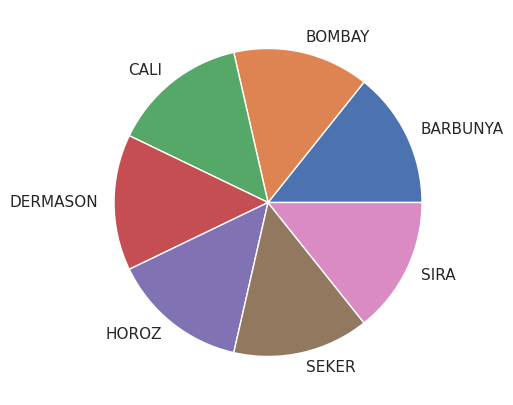

In [12]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

# PCA

In [13]:
X = df.drop(columns=['Class'])
X.head(10)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,68087,1029.885,372.473520,233.895222,1.592480,0.778253,69320,294.433457,0.700030,0.982213,0.806671,0.790482,0.005471,0.001318,0.624861,0.995079
1,68384,1005.668,363.010296,240.873847,1.507056,0.748136,69167,295.074928,0.743854,0.988680,0.849679,0.812856,0.005308,0.001430,0.660734,0.995763
2,85505,1160.758,432.154231,253.682141,1.703526,0.809574,87053,329.952038,0.739381,0.982218,0.797477,0.763505,0.005054,0.001059,0.582940,0.993054
3,76163,1067.403,370.011917,262.940445,1.407208,0.703569,77251,311.406075,0.777094,0.985916,0.840034,0.841611,0.004858,0.001503,0.708309,0.996738
4,78761,1082.774,415.085633,242.199547,1.713817,0.812118,79766,316.672733,0.745102,0.987401,0.844200,0.762909,0.005270,0.001101,0.582031,0.997494
5,76997,1099.457,413.360694,237.607681,1.739677,0.818280,78041,313.106412,0.792933,0.986622,0.800437,0.757465,0.005369,0.001090,0.573754,0.998146
6,78414,1108.022,352.244776,285.347398,1.234442,0.586316,80312,315.974375,0.705936,0.976367,0.802614,0.897031,0.004492,0.001794,0.804664,0.993311
7,61884,977.874,332.109045,237.938041,1.395780,0.697643,62975,280.701186,0.724569,0.982676,0.813247,0.845208,0.005367,0.001689,0.714376,0.997112
8,65290,1032.586,342.669122,243.818753,1.405426,0.702658,66600,288.322406,0.750796,0.980330,0.769492,0.841402,0.005248,0.001623,0.707957,0.994981
9,72360,1091.040,369.611250,250.675694,1.474460,0.734864,74162,303.531899,0.743603,0.975702,0.763883,0.821219,0.005108,0.001433,0.674401,0.994377


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,3500.0,69832.062857,46025.031743,21101.000000,40302.250000,53458.500000,75317.000000,254616.000000
Perimeter,3500.0,970.971042,295.638030,533.701000,745.139500,909.066500,1074.959500,1985.370000
MajorAxisLength,3500.0,363.056308,114.545038,185.381921,270.470481,350.200000,408.103109,738.860154
MinorAxisLength,3500.0,227.614015,66.735644,132.187521,184.494233,203.196403,242.134997,460.198497
AspectRation,3500.0,1.598957,0.245017,1.036423,1.450184,1.577529,1.726099,2.387395
Eccentricity,3500.0,0.756518,0.091914,0.262774,0.724221,0.773413,0.815085,0.908048
ConvexArea,3500.0,70809.142571,46679.691919,21462.000000,40761.500000,54212.000000,76516.000000,263261.000000
EquivDiameter,3500.0,285.843545,84.902717,163.910426,226.526860,260.893609,309.671733,569.374358
Extent,3500.0,0.751364,0.050098,0.555315,0.720204,0.761514,0.788773,0.858420
Solidity,3500.0,0.986590,0.005142,0.944568,0.984679,0.987851,0.989946,0.994677


## Standardize the Data

In [15]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,-0.037921,0.199306,0.082226,0.094134,-0.026437,0.236503,-0.031906,0.101188,-1.024809,-0.851385,-0.934809,-0.082529,-0.395336,-0.359725,-0.119828,0.147893
1,-0.031467,0.117380,-0.000402,0.198720,-0.375134,-0.091207,-0.035184,0.108744,-0.149918,0.406500,-0.221759,0.281566,-0.514277,-0.178306,0.243850,0.294110
2,0.340579,0.642049,0.603324,0.390674,0.426846,0.577323,0.348035,0.519592,-0.239214,-0.850451,-1.087250,-0.521520,-0.700800,-0.778019,-0.544818,-0.284879
3,0.137574,0.326229,0.060732,0.529424,-0.782705,-0.576154,0.138021,0.301123,0.513673,-0.131060,-0.381668,0.749508,-0.844564,-0.058507,0.726159,0.502504
4,0.194029,0.378229,0.454291,0.218588,0.468850,0.605005,0.191907,0.363164,-0.125008,0.157724,-0.312602,-0.531216,-0.542312,-0.710216,-0.554039,0.664080
5,0.155697,0.434668,0.439230,0.149771,0.574412,0.672058,0.154947,0.321153,0.829879,0.006344,-1.038169,-0.619808,-0.470176,-0.728252,-0.637950,0.803525
6,0.186489,0.463643,-0.094400,0.865229,-1.487925,-1.852027,0.203605,0.354937,-0.906893,-1.988496,-1.002077,1.651364,-1.113077,0.412501,1.702999,-0.229995
7,-0.172715,0.023353,-0.270214,0.154722,-0.829356,-0.640637,-0.167852,-0.060576,-0.534916,-0.761374,-0.825788,0.808042,-0.471564,0.242783,0.787670,0.582406
8,-0.098701,0.208443,-0.178009,0.242855,-0.789981,-0.586072,-0.090184,0.029201,-0.011327,-1.217586,-1.551221,0.746104,-0.558286,0.134579,0.722591,0.126908
9,0.054933,0.406193,0.057234,0.345617,-0.508188,-0.235623,0.071837,0.208366,-0.154933,-2.117914,-1.644207,0.417671,-0.661327,-0.172615,0.382405,-0.002055


In [16]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,3500.0,6.496391e-17,1.000143,-1.058946,-0.641695,-0.355804,0.119190,4.015431
Perimeter,3500.0,-6.496391e-17,1.000143,-1.479284,-0.763988,-0.209423,0.351793,3.431710
MajorAxisLength,3500.0,-1.299278e-16,1.000143,-1.551353,-0.808407,-0.112254,0.393323,3.281308
MinorAxisLength,3500.0,3.248195e-16,1.000143,-1.430122,-0.646221,-0.365938,0.217621,3.485659
AspectRation,3500.0,-1.461688e-16,1.000143,-2.296226,-0.607279,-0.087467,0.518986,3.218351
Eccentricity,3500.0,-6.496391e-17,1.000143,-5.372586,-0.351429,0.183838,0.637291,1.648847
ConvexArea,3500.0,3.248195e-17,1.000143,-1.057295,-0.643790,-0.355605,0.122273,4.123407
EquivDiameter,3500.0,6.496391e-17,1.000143,-1.436356,-0.698743,-0.293907,0.280693,3.339956
Extent,3500.0,1.218073e-15,1.000143,-3.913843,-0.622055,0.202646,0.746816,2.137225
Solidity,3500.0,-1.266796e-14,1.000143,-8.174022,-0.371711,0.245270,0.652760,1.573210


**Observations and variables**

In [17]:
observations = list(df.index)
variables = list(df.columns)

## Box and Whisker Plots

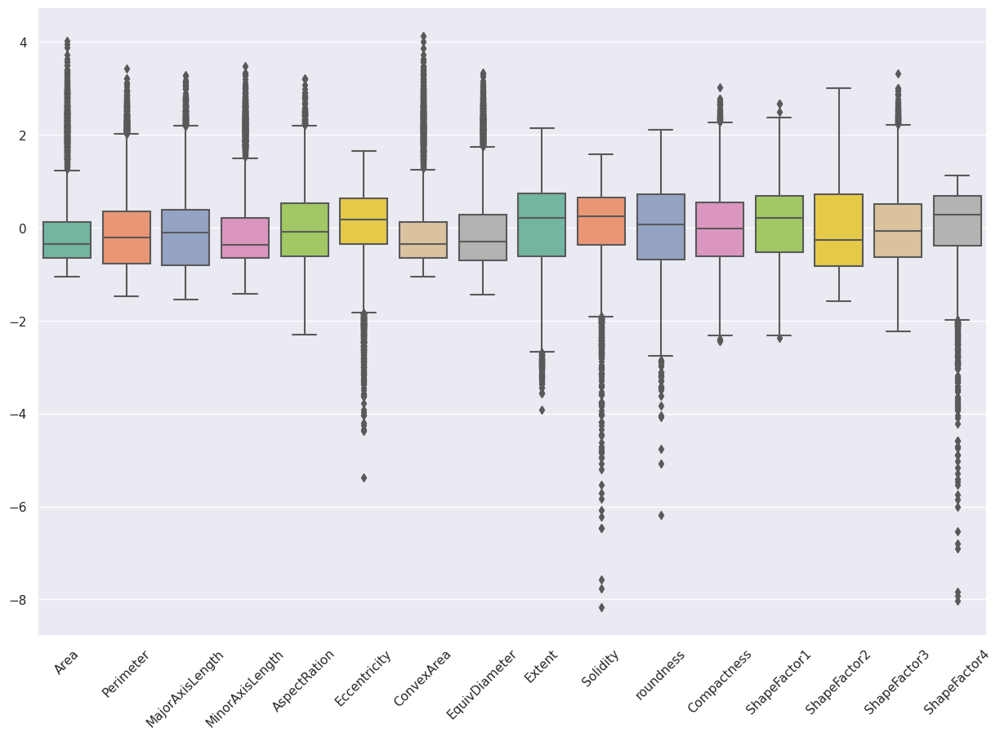

In [18]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

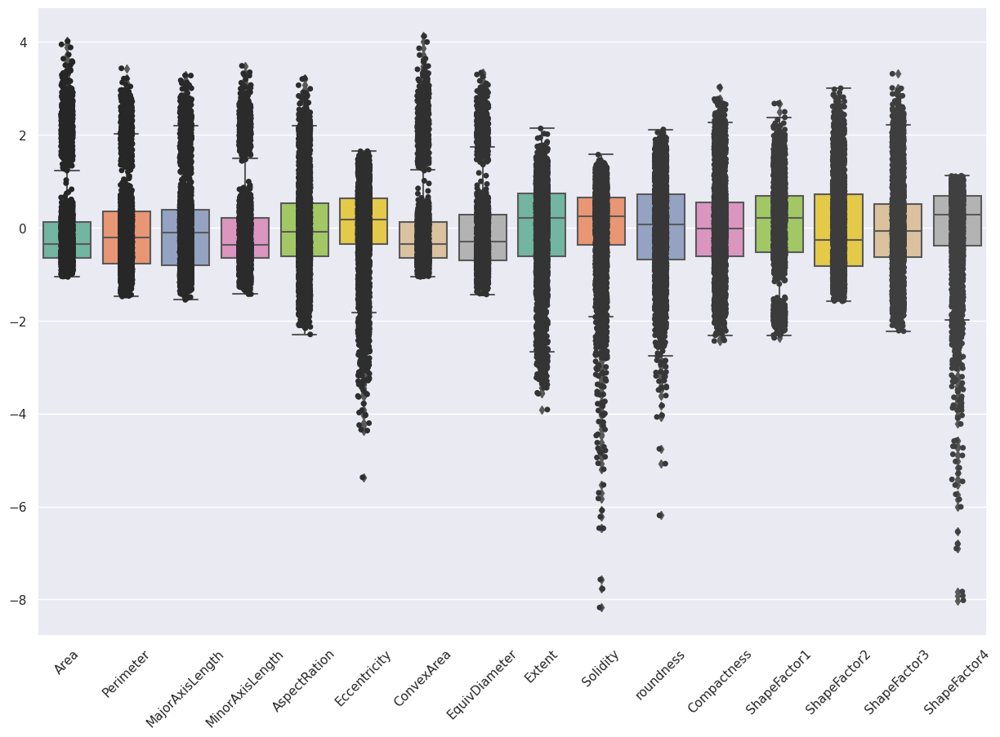

In [19]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


## Correlation Matrix

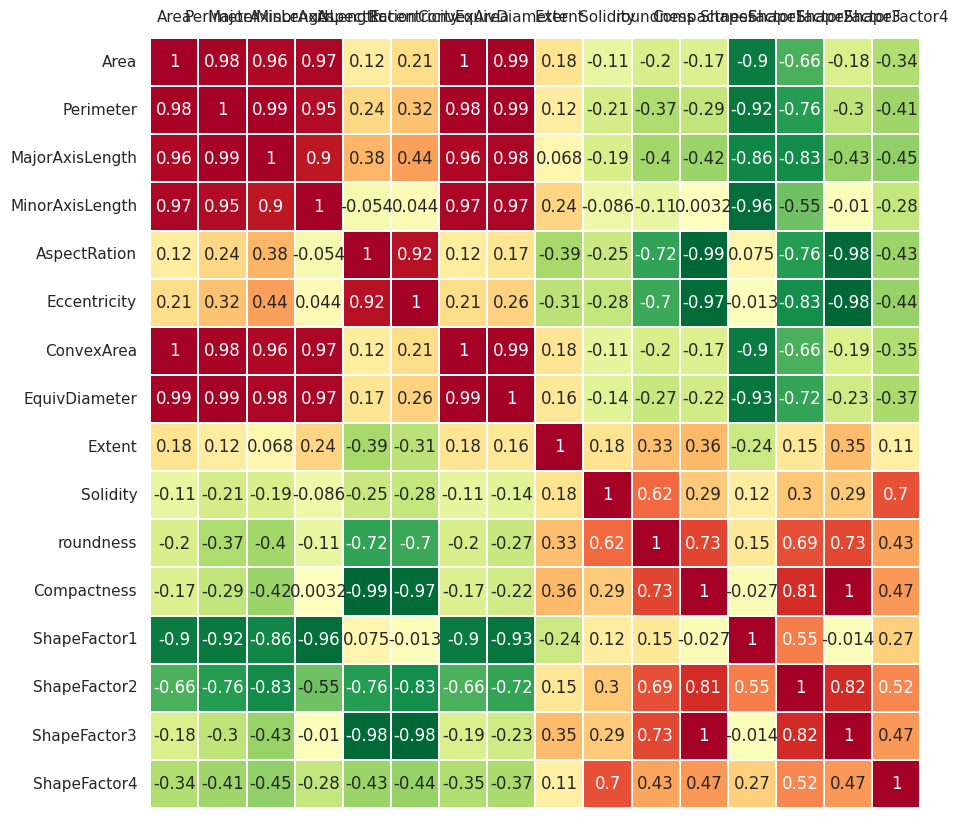

In [20]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

## Applying PCA

In [21]:
grouped_data = df.groupby('Class')

# Access the groups
groups = grouped_data.groups

# Display the groups
for group_name, group_indices in groups.items():
    print(f"Group: {group_name}")

Group: BARBUNYA
Group: BOMBAY
Group: CALI
Group: DERMASON
Group: HOROZ
Group: SEKER
Group: SIRA


Text(0, 0.5, 'Z_2')

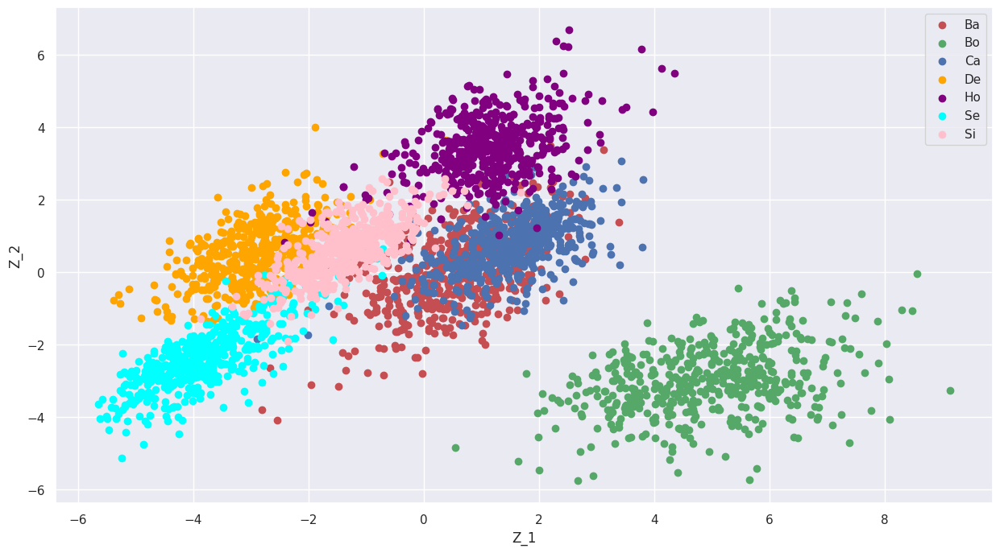

In [22]:
pca = PCA()
Z = pca.fit_transform(X)

# Occupancy->1,  No_Occupancy->0
idx_No_Occupancy = np.where(y == 0)
idx_Occupancy = np.where(y == 1)

idx_1 = np.where(y == 'BARBUNYA')
idx_2 = np.where(y == 'BOMBAY')
idx_3 = np.where(y == 'CALI')
idx_4 = np.where(y == 'DERMASON')
idx_5 = np.where(y == 'HOROZ')
idx_6 = np.where(y == 'SEKER')
idx_7 = np.where(y == 'SIRA')



plt. figure(figsize=(15,8))
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='Ba')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='g', label='Bo')
plt.scatter(Z[idx_3,0], Z[idx_3,1], c='b', label='Ca')
plt.scatter(Z[idx_4,0], Z[idx_4,1], c='orange', label='De')
plt.scatter(Z[idx_5,0], Z[idx_5,1], c='purple', label='Ho')
plt.scatter(Z[idx_6,0], Z[idx_6,1], c='cyan', label='Se')
plt.scatter(Z[idx_7,0], Z[idx_7,1], c='pink', label='Si')

plt.legend()
plt.xlabel('Z_1')
plt.ylabel('Z_2')


## Eigenvectors

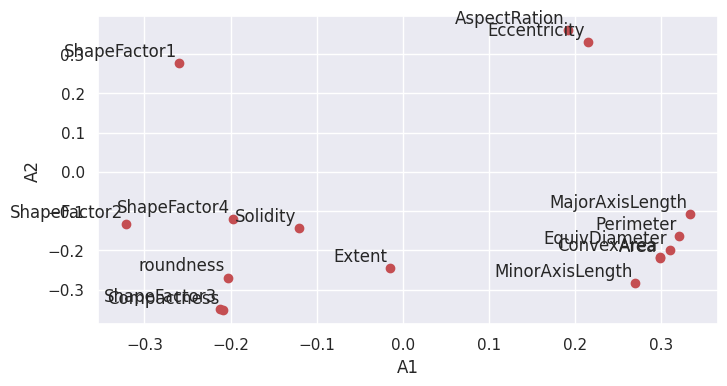

In [23]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

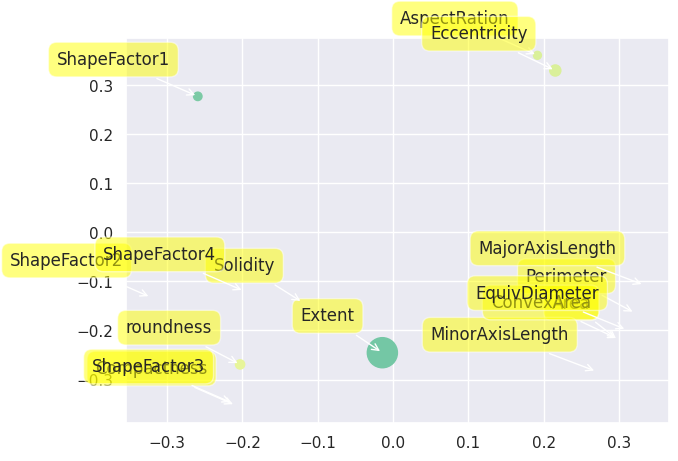

In [24]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

## Scree plot

array([8.40739343e+00, 4.71339363e+00, 1.32367200e+00, 7.78457582e-01,
       4.85657884e-01, 1.30547390e-01, 1.04395512e-01, 4.92269354e-02,
       9.48314228e-03, 1.16952401e-03, 8.27839264e-04, 2.11203285e-04,
       1.22443634e-04, 1.05372059e-05, 1.98911330e-06, 1.69236677e-06])

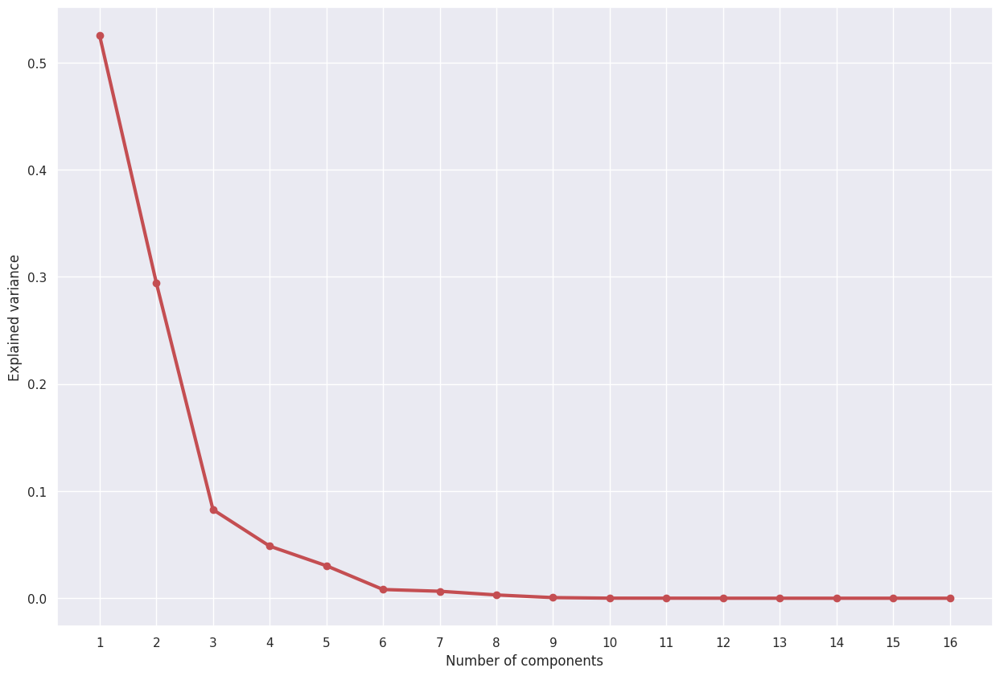

In [25]:
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

## Explained Variance

Text(0, 0.5, 'Cumulative explained variance')

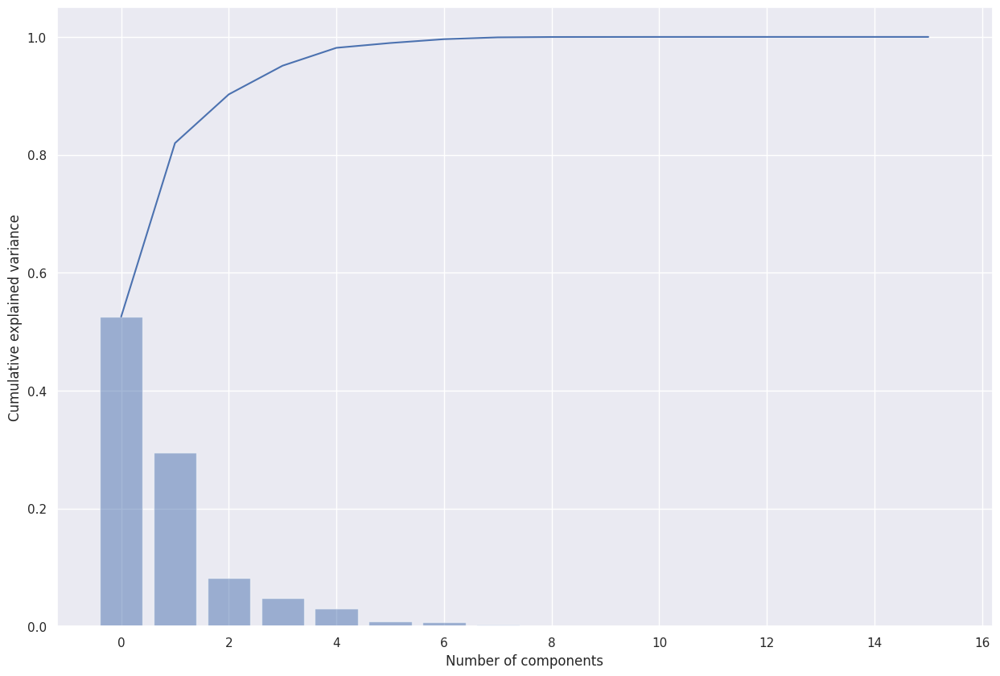

In [26]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

## Explained Variance per PC

In [27]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}
PC_variance


{'0': 'PC 1 (52.5%)',
 '1': 'PC 2 (29.5%)',
 '2': 'PC 3 (8.3%)',
 '3': 'PC 4 (4.9%)',
 '4': 'PC 5 (3.0%)',
 '5': 'PC 6 (0.8%)',
 '6': 'PC 7 (0.7%)',
 '7': 'PC 8 (0.3%)',
 '8': 'PC 9 (0.1%)',
 '9': 'PC 10 (0.0%)',
 '10': 'PC 11 (0.0%)',
 '11': 'PC 12 (0.0%)',
 '12': 'PC 13 (0.0%)',
 '13': 'PC 14 (0.0%)',
 '14': 'PC 15 (0.0%)',
 '15': 'PC 16 (0.0%)'}

## Biplot

array([ 0.61112838, -0.54793788,  0.59881093, ...,  1.23609793,
        1.48012823,  0.98461135])

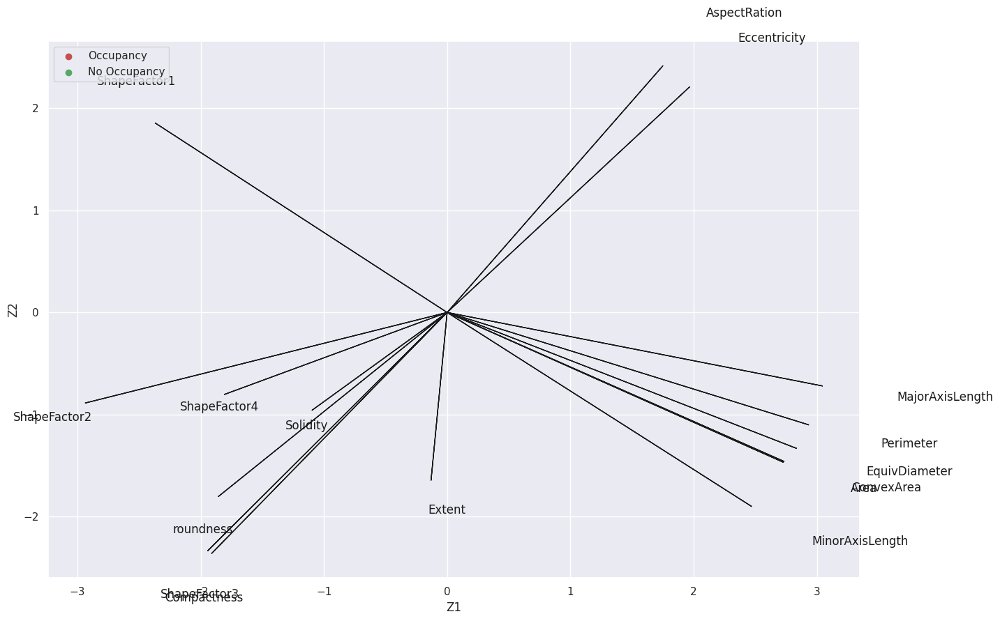

In [28]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('Z1')
plt.ylabel('Z2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Occupancy,0], Z[idx_Occupancy,1], c='r', label='Occupancy')
plt.scatter(Z[idx_No_Occupancy,0], Z[idx_No_Occupancy,1], c='g', label='No Occupancy')

plt.legend(loc='upper left')
Z1
Z2

# PCA Using Library

In [29]:
!pip install pca

In [30]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [16] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [16] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


##Principal Components

In [31]:
out['PC']

,PC1,PC2,PC3,PC4
0,0.711600,0.611128,0.679466,-1.046765
1,0.033823,-0.547938,-0.229521,-0.373823
2,2.125557,0.598811,0.493994,-0.190668
3,0.083186,-1.610711,0.384342,-0.075608
4,1.293115,0.375801,-0.884093,-0.161349
...,...,...,...,...
3495,-1.094016,1.835944,-0.331575,1.252579
3496,-0.721757,0.443855,-0.288445,1.285933
3497,-0.568776,1.236098,-0.429742,-0.047224
3498,-0.260451,1.480128,-1.227144,-0.989494


## Scatter Plot

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [98.15%] of the variance'}, xlabel='PC1 (52.5% expl.var)', ylabel='PC2 (29.4% expl.var)'>)

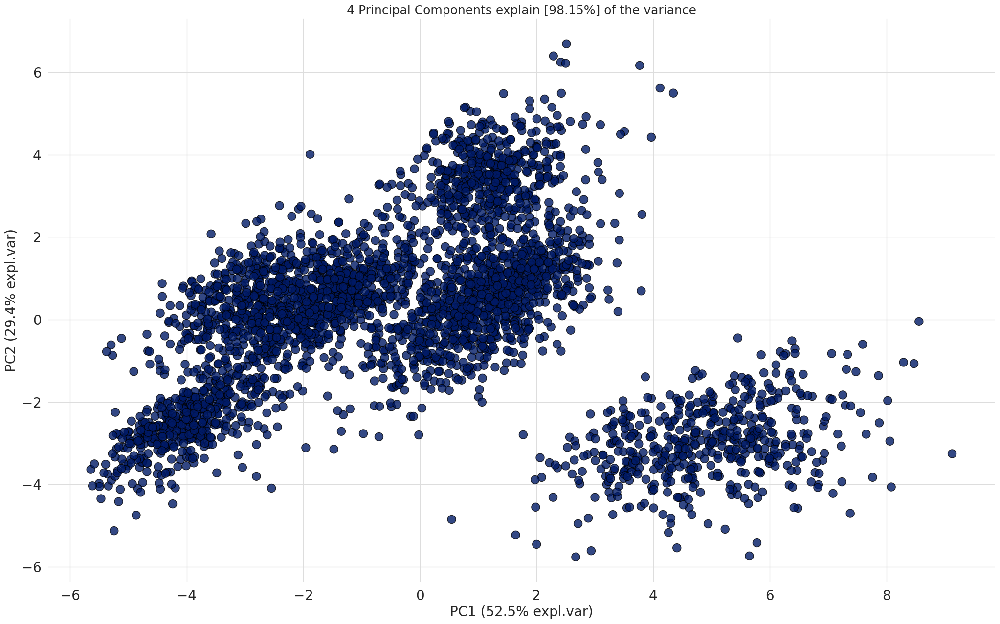

In [32]:
model.scatter(label=True, legend=False)

## EigenVectors

In [33]:
A = out['loadings'].T

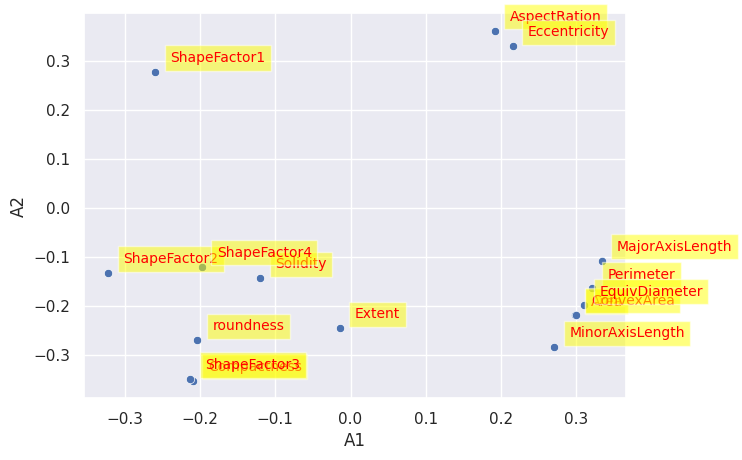

In [34]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('A1')
plt.ylabel('A2')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

## Screen Plot

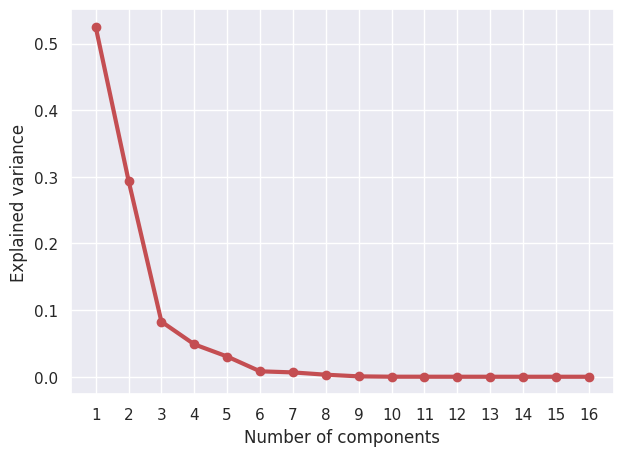

In [35]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

## Explained Variance Plot

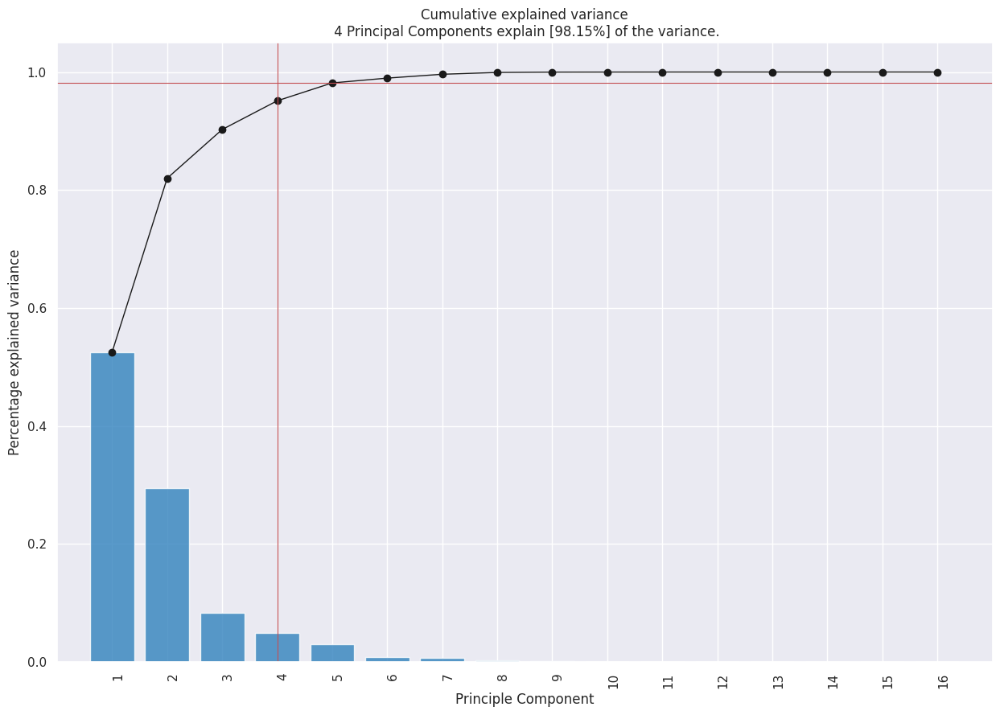

In [36]:
model.plot();

## Biplot

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [98.15%] of the variance'}, xlabel='PC1 (52.5% expl.var)', ylabel='PC2 (29.4% expl.var)'>)

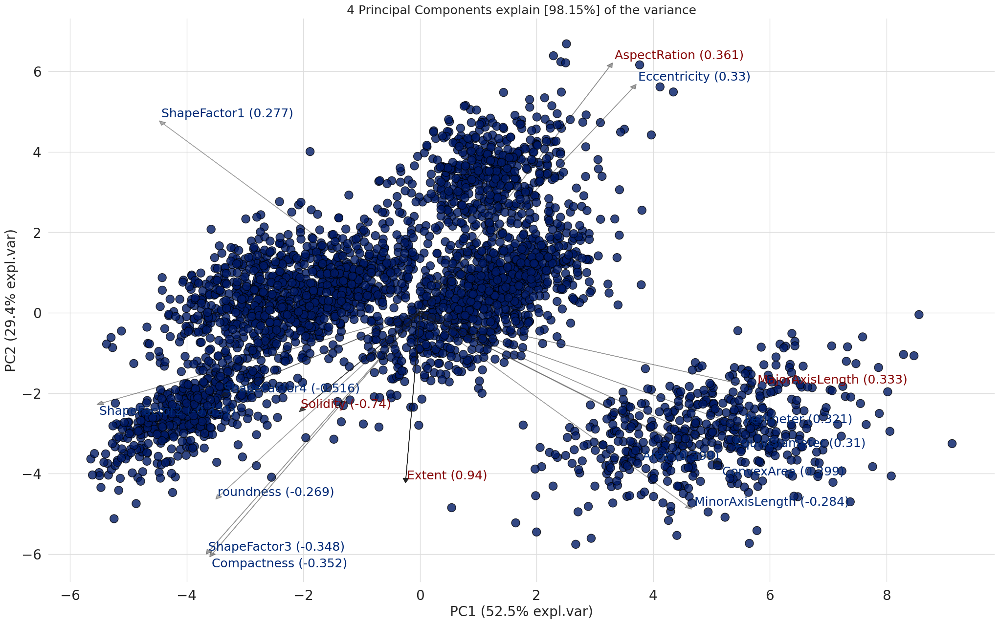

In [37]:
model.biplot(label=False, legend=False, color_arrow='k')

# Classification with Pycaret

At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found. Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [38]:
from pycaret.utils import version
version()


'3.0.0'

In [39]:
# from pycaret.utils import enable_colab
# enable_colab()

## Data Splitting

In order to demonstrate the predict_model() function on unseen data, a sample of 267 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 267 records were not available at the time when the machine learning experiment was performed.

In [40]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (3150, 17)
Unseen Data For Predictions: (350, 17)


## Setting up the Environment in PyCaret

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline.

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [41]:
from pycaret.classification import *
clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(3500, 17)"
5,Transformed data shape,"(3500, 3)"
6,Transformed train set shape,"(2450, 3)"
7,Transformed test set shape,"(1050, 3)"
8,Numeric features,16
9,Preprocess,True


## Comparing All Models

In [42]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.8547,0.9829,0.8547,0.8586,0.8535,0.8305,0.8316,0.1670
lda,Linear Discriminant Analysis,0.8478,0.9816,0.8478,0.8531,0.8462,0.8224,0.8238,0.1720
lr,Logistic Regression,0.8441,0.9821,0.8441,0.8472,0.8427,0.8181,0.8191,1.1880
gbc,Gradient Boosting Classifier,0.8224,0.9762,0.8224,0.8245,0.8211,0.7929,0.7937,2.0380
nb,Naive Bayes,0.8216,0.9742,0.8216,0.8236,0.8187,0.7919,0.7932,0.3270
knn,K Neighbors Classifier,0.8212,0.9600,0.8212,0.8215,0.8200,0.7914,0.7919,0.3490
rf,Random Forest Classifier,0.8212,0.9720,0.8212,0.8221,0.8202,0.7914,0.7920,0.6200
et,Extra Trees Classifier,0.8196,0.9708,0.8196,0.8207,0.8188,0.7895,0.7900,0.5920
xgboost,Extreme Gradient Boosting,0.8122,0.9744,0.8122,0.8145,0.8117,0.7810,0.7815,0.3530
lightgbm,Light Gradient Boosting Machine,0.8082,0.9728,0.8082,0.8113,0.8077,0.7762,0.7769,3.2790


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [43]:
best_model

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

Decision Tree Classifier ('dt')
K Neighbors Classifier ('knn')
Logistic Regression ('lr')
There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.




## Decision Tree Classifier

In [44]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8122,0.8905,0.8122,0.8114,0.8113,0.7810,0.7811
1,0.8041,0.8857,0.8041,0.7991,0.8004,0.7714,0.7719
2,0.7878,0.8762,0.7878,0.7893,0.7881,0.7524,0.7525
3,0.8204,0.8952,0.8204,0.8199,0.8200,0.7905,0.7905
4,0.7959,0.8810,0.7959,0.7969,0.7935,0.7619,0.7631
5,0.8163,0.8929,0.8163,0.8137,0.8130,0.7857,0.7865
6,0.7633,0.8619,0.7633,0.7666,0.7636,0.7238,0.7242
7,0.7755,0.8690,0.7755,0.7848,0.7782,0.7381,0.7388
8,0.7796,0.8714,0.7796,0.7850,0.7795,0.7429,0.7436


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune a Model

 How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.



**Tune Decision Tree Model**

In [45]:
!pip install statsmodels --upgrade
!pip install "schemdraw<0.16"

In [46]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8245,0.9742,0.8245,0.8339,0.8216,0.7952,0.7977
1,0.8327,0.9747,0.8327,0.8368,0.8252,0.8048,0.8076
2,0.7918,0.9695,0.7918,0.7991,0.7903,0.7571,0.7592
3,0.8490,0.9780,0.8490,0.8540,0.8459,0.8238,0.8258
4,0.8041,0.9706,0.8041,0.8076,0.7998,0.7714,0.7741
5,0.8286,0.9780,0.8286,0.8493,0.8253,0.8000,0.8050
6,0.8286,0.9682,0.8286,0.8373,0.8302,0.8000,0.8010
7,0.8286,0.9689,0.8286,0.8302,0.8247,0.8000,0.8018
8,0.8327,0.9742,0.8327,0.8335,0.8312,0.8048,0.8054


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [47]:
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.002, min_samples_leaf=5,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

### Evaluate Decision Tree Model

In [48]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create K Neighbors Model

In [49]:
knn = create_model('knn')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8531,0.9685,0.8531,0.8528,0.8527,0.8286,0.8286
1,0.8163,0.9615,0.8163,0.8076,0.8110,0.7857,0.7861
2,0.8245,0.9529,0.8245,0.8287,0.8250,0.7952,0.7957
3,0.8449,0.9642,0.8449,0.8425,0.8428,0.8190,0.8193
4,0.8082,0.9653,0.8082,0.8117,0.8051,0.7762,0.7782
5,0.8327,0.9692,0.8327,0.8315,0.8306,0.8048,0.8053
6,0.8286,0.9541,0.8286,0.8314,0.8287,0.8000,0.8004
7,0.7796,0.9556,0.7796,0.7849,0.7816,0.7429,0.7431
8,0.8041,0.9539,0.8041,0.8040,0.8020,0.7714,0.7721


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune K Neighbors Model

In [50]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8776,0.9866,0.8776,0.8857,0.8770,0.8571,0.8588
1,0.8776,0.9868,0.8776,0.8863,0.8710,0.8571,0.8602
2,0.8245,0.9781,0.8245,0.8242,0.8239,0.7952,0.7954
3,0.8735,0.9846,0.8735,0.8804,0.8689,0.8524,0.8548
4,0.8408,0.9768,0.8408,0.8450,0.8379,0.8143,0.8161
5,0.8490,0.9837,0.8490,0.8482,0.8462,0.8238,0.8247
6,0.8367,0.9772,0.8367,0.8439,0.8370,0.8095,0.8106
7,0.8245,0.9726,0.8245,0.8291,0.8224,0.7952,0.7970
8,0.8449,0.9831,0.8449,0.8458,0.8424,0.8190,0.8200


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate K Neighbors Model

In [51]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Logistic Regression Model

In [52]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8612,0.9863,0.8612,0.8650,0.8611,0.8381,0.8389
1,0.8898,0.9869,0.8898,0.8925,0.8861,0.8714,0.8731
2,0.8245,0.9790,0.8245,0.8334,0.8228,0.7952,0.7972
3,0.8531,0.9848,0.8531,0.8518,0.8510,0.8286,0.8291
4,0.8245,0.9819,0.8245,0.8314,0.8244,0.7952,0.7966
5,0.8571,0.9852,0.8571,0.8543,0.8536,0.8333,0.8341
6,0.8286,0.9805,0.8286,0.8343,0.8302,0.8000,0.8004
7,0.8163,0.9757,0.8163,0.8212,0.8144,0.7857,0.7874
8,0.8449,0.9840,0.8449,0.8473,0.8432,0.8190,0.8199


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [53]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Tune Logistic Regression Model

In [54]:
tuned_lr = tune_model(lr)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8653,0.9852,0.8653,0.8695,0.8650,0.8429,0.8437
1,0.8776,0.9830,0.8776,0.8809,0.8729,0.8571,0.8590
2,0.8245,0.9779,0.8245,0.8287,0.8223,0.7952,0.7967
3,0.8816,0.9853,0.8816,0.8806,0.8797,0.8619,0.8624
4,0.8408,0.9805,0.8408,0.8448,0.8391,0.8143,0.8156
5,0.8653,0.9838,0.8653,0.8658,0.8628,0.8429,0.8438
6,0.8245,0.9790,0.8245,0.8297,0.8259,0.7952,0.7956
7,0.8163,0.9749,0.8163,0.8220,0.8131,0.7857,0.7880
8,0.8367,0.9812,0.8367,0.8388,0.8345,0.8095,0.8105


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Logistic Regression Model

In [55]:
tuned_lr

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [56]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Random Forest Model

In [57]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8286,0.9737,0.8286,0.8296,0.8278,0.8000,0.8005
1,0.8204,0.9766,0.8204,0.8131,0.8148,0.7905,0.7912
2,0.8367,0.9637,0.8367,0.8384,0.8365,0.8095,0.8099
3,0.8490,0.9802,0.8490,0.8480,0.8473,0.8238,0.8242
4,0.8204,0.9743,0.8204,0.8212,0.8186,0.7905,0.7914
5,0.8449,0.9788,0.8449,0.8437,0.8425,0.8190,0.8197
6,0.8082,0.9731,0.8082,0.8122,0.8079,0.7762,0.7770
7,0.7796,0.9600,0.7796,0.7875,0.7820,0.7429,0.7434
8,0.8490,0.9770,0.8490,0.8516,0.8486,0.8238,0.8244


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune Random Forest Model

In [58]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8531,0.9792,0.8531,0.8584,0.8532,0.8286,0.8294
1,0.8449,0.9776,0.8449,0.8446,0.8391,0.8190,0.8208
2,0.7959,0.9704,0.7959,0.8057,0.7982,0.7619,0.7628
3,0.8571,0.9815,0.8571,0.8600,0.8558,0.8333,0.8344
4,0.8163,0.9734,0.8163,0.8158,0.8135,0.7857,0.7868
5,0.8571,0.9813,0.8571,0.8580,0.8538,0.8333,0.8347
6,0.8163,0.9717,0.8163,0.8226,0.8153,0.7857,0.7871
7,0.8000,0.9694,0.8000,0.8026,0.7968,0.7667,0.7685
8,0.8082,0.9751,0.8082,0.8115,0.8083,0.7762,0.7767


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Random Forest Model

In [59]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Support Vector Model

In [60]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6776,0.0000,0.6776,0.6304,0.6358,0.6238,0.6487
1,0.6653,0.0000,0.6653,0.6923,0.6719,0.6095,0.6119
2,0.7673,0.0000,0.7673,0.8212,0.7688,0.7286,0.7389
3,0.6327,0.0000,0.6327,0.5618,0.5821,0.5714,0.5950
4,0.7388,0.0000,0.7388,0.7280,0.7130,0.6952,0.7048
5,0.6327,0.0000,0.6327,0.6313,0.5750,0.5714,0.6151
6,0.6980,0.0000,0.6980,0.6344,0.6588,0.6476,0.6599
7,0.6327,0.0000,0.6327,0.5542,0.5604,0.5714,0.6185
8,0.6245,0.0000,0.6245,0.6092,0.6051,0.5619,0.5756


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune Support Vector Model

In [61]:
tuned_svm = tune_model(svm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6571,0.0000,0.6571,0.6249,0.6156,0.6000,0.6363
1,0.7673,0.0000,0.7673,0.7091,0.7270,0.7286,0.7474
2,0.6531,0.0000,0.6531,0.5702,0.5881,0.5952,0.6452
3,0.7388,0.0000,0.7388,0.6624,0.6933,0.6952,0.7080
4,0.7347,0.0000,0.7347,0.6944,0.6927,0.6905,0.7177
5,0.7061,0.0000,0.7061,0.6907,0.6528,0.6571,0.6942
6,0.6571,0.0000,0.6571,0.6066,0.6149,0.6000,0.6242
7,0.6694,0.0000,0.6694,0.5863,0.6048,0.6143,0.6657
8,0.6531,0.0000,0.6531,0.5638,0.5846,0.5952,0.6409


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Support Vector Model

In [62]:
evaluate_model(tuned_svm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create the Best Model

In [63]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8776,0.9871,0.8776,0.8857,0.8770,0.8571,0.8588
1,0.8776,0.9871,0.8776,0.8877,0.8713,0.8571,0.8604
2,0.8327,0.9796,0.8327,0.8369,0.8326,0.8048,0.8055
3,0.8531,0.9852,0.8531,0.8542,0.8483,0.8286,0.8304
4,0.8449,0.9812,0.8449,0.8483,0.8428,0.8190,0.8205
5,0.8531,0.9848,0.8531,0.8572,0.8485,0.8286,0.8309
6,0.8408,0.9796,0.8408,0.8463,0.8408,0.8143,0.8152
7,0.8327,0.9765,0.8327,0.8386,0.8301,0.8048,0.8068
8,0.8367,0.9821,0.8367,0.8394,0.8340,0.8095,0.8109


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [64]:
tuned_best_model


QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

### Evaluate the Best Model

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.



In [65]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Classification + PCA**

In [66]:
clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 5)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(3500, 17)"
5,Transformed data shape,"(3500, 6)"
6,Transformed train set shape,"(2450, 6)"
7,Transformed test set shape,"(1050, 6)"
8,Numeric features,16
9,Preprocess,True


In [67]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.9265,0.9925,0.9265,0.9297,0.9268,0.9143,0.9147,0.1960
lr,Logistic Regression,0.9257,0.9944,0.9257,0.9291,0.9259,0.9133,0.9138,0.2440
et,Extra Trees Classifier,0.9196,0.9932,0.9196,0.9218,0.9197,0.9062,0.9065,0.6010
xgboost,Extreme Gradient Boosting,0.9196,0.9922,0.9196,0.9218,0.9196,0.9062,0.9066,0.4530
knn,K Neighbors Classifier,0.9163,0.9836,0.9163,0.9189,0.9163,0.9024,0.9028,0.2730
lightgbm,Light Gradient Boosting Machine,0.9163,0.9922,0.9163,0.9191,0.9164,0.9024,0.9028,2.8990
rf,Random Forest Classifier,0.9151,0.9922,0.9151,0.9175,0.9152,0.9010,0.9013,0.6600
gbc,Gradient Boosting Classifier,0.9131,0.9917,0.9131,0.9162,0.9133,0.8986,0.8990,2.8630
lda,Linear Discriminant Analysis,0.9110,0.9921,0.9110,0.9174,0.9117,0.8962,0.8971,0.2150
dt,Decision Tree Classifier,0.8898,0.9357,0.8898,0.8921,0.8896,0.8714,0.8719,0.2000


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [68]:
best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

## Tune the Best Model

In [69]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9388,0.9974,0.9388,0.9442,0.9394,0.9286,0.9293
1,0.9265,0.9927,0.9265,0.9348,0.9257,0.9143,0.9158
2,0.9102,0.9899,0.9102,0.9152,0.9119,0.8952,0.8955
3,0.9224,0.9957,0.9224,0.9287,0.9229,0.9095,0.9104
4,0.8980,0.9880,0.8980,0.8982,0.8975,0.8810,0.8811
5,0.9224,0.9969,0.9224,0.9252,0.9224,0.9095,0.9100
6,0.9306,0.9874,0.9306,0.9334,0.9310,0.9190,0.9194
7,0.9306,0.9949,0.9306,0.9375,0.9320,0.9190,0.9199
8,0.9102,0.9960,0.9102,0.9116,0.9091,0.8952,0.8958


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [70]:
tuned_best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

## Evaluate the Best Model

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [71]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Explainable AI with Shapley values

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

SHAP is a Python library for model interpretation and feature importance analysis, and it provides a variety of tools for explaining the output of machine learning models. The library is based on the Shapley value, a concept from cooperative game theory that assigns a value to each player in a game based on their contribution to the overall outcome.

In [72]:
!pip3 install shap

In [73]:
import shap

In [74]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9347,0.9940,0.9347,0.9409,0.9357,0.9238,0.9247
1,0.9020,0.9955,0.9020,0.9028,0.9005,0.8857,0.8863
2,0.8898,0.9904,0.8898,0.8948,0.8911,0.8714,0.8719
3,0.9184,0.9960,0.9184,0.9217,0.9187,0.9048,0.9052
4,0.9020,0.9919,0.9020,0.9026,0.9006,0.8857,0.8862
5,0.9551,0.9954,0.9551,0.9551,0.9550,0.9476,0.9476
6,0.9020,0.9874,0.9020,0.9045,0.9025,0.8857,0.8860
7,0.9061,0.9893,0.9061,0.9093,0.9072,0.8905,0.8906
8,0.9224,0.9934,0.9224,0.9220,0.9217,0.9095,0.9097


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [75]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9020,0.9902,0.9020,0.9063,0.9022,0.8857,0.8864
1,0.8980,0.9892,0.8980,0.9046,0.8977,0.8810,0.8821
2,0.8694,0.9841,0.8694,0.8725,0.8701,0.8476,0.8479
3,0.9102,0.9898,0.9102,0.9173,0.9108,0.8952,0.8962
4,0.8735,0.9838,0.8735,0.8775,0.8719,0.8524,0.8536
5,0.9020,0.9927,0.9020,0.9074,0.9019,0.8857,0.8865
6,0.8857,0.9817,0.8857,0.8878,0.8862,0.8667,0.8668
7,0.9061,0.9879,0.9061,0.9127,0.9081,0.8905,0.8909
8,0.8735,0.9875,0.8735,0.8821,0.8728,0.8524,0.8540


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples.

  Cloning https://github.com/slundberg/shap.git to /tmp/pip-req-build-le3qj8yo
  Running command git clone --filter=blob:none --quiet https://github.com/slundberg/shap.git /tmp/pip-req-build-le3qj8yo
  Resolved https://github.com/slundberg/shap.git to commit 63223e11eb651dc22b802647526b6bb8d0a02293
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done


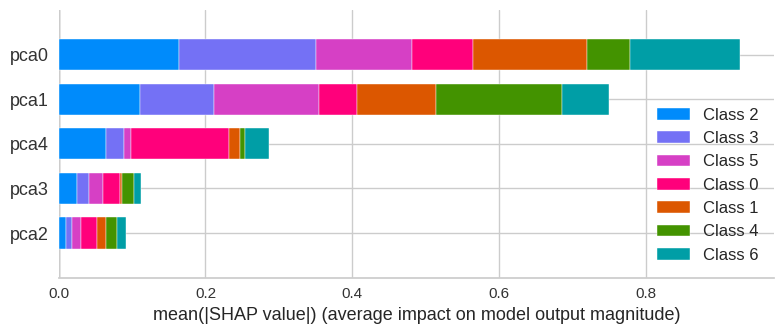

In [76]:

interpret_model(tuned_rf_pca, plot='summary')

**Visualize a single prediction**

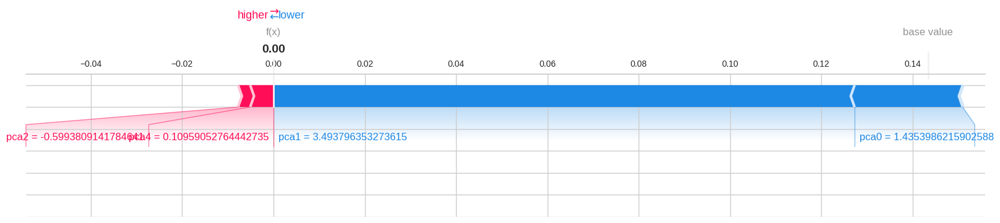

In [83]:
shap.initjs()
interpret_model(tuned_rf_pca, plot='reason', observation=32,matplotlib = True)

**Visualize many predictions**

In [78]:
interpret_model(tuned_rf_pca, plot='reason')